# 20d070009- Amruta Mahendra Parulekar
# 200070007- Anmol Saraf

In [ ]:
#Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Question 1



In [ ]:
#Importing libraries
import numpy as np
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt
import cv2
from google.colab.patches import cv2_imshow
import math


#a. Add additive white Gaussian noise(AWGN)with variable variance to any given image, whether grayscale or color.The noise should be independent in RGB channels for color images.


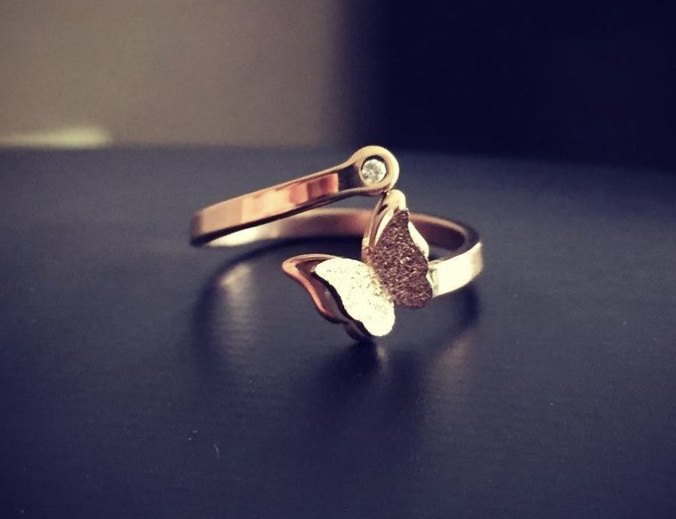

In [ ]:
#Reading image
image1=cv2.imread('/content/drive/MyDrive/ee610_ass1/IMG_7780.PNG')
from google.colab.patches import cv2_imshow
#Displaying image
cv2_imshow(image1)
#making copies of the image for using further
image1a=image1.copy()
image1b=image1.copy()
image1c=image1.copy()
image1d=image1.copy()

In [ ]:
#printing the shape of the image
print(image1a.shape)
w=image1a.shape[0]
h=image1a.shape[1]

(519, 676, 3)


In [ ]:
var=1000
mean=0
def AWGN(var):
  #Adding gaussian noise to each channel
  gaussian_noiser = np.random.normal(mean,var**0.5,(w,h))
  gaussian_noiseb = np.random.normal(mean,var**0.5,(w,h))
  gaussian_noiseg = np.random.normal(mean,var**0.5,(w,h))

  #The noise added overflows at 0 and 255, leading to very bright or very dark dots. To avoid this, we clipped the image after noise was added.
  noisyr = np.clip(image1a[:,:,0] + gaussian_noiser,0,255)
  noisyb = np.clip(image1a[:,:,1] + gaussian_noiseb,0,255)
  noisyg = np.clip(image1a[:,:,2] + gaussian_noiseg,0,255)

  #Saving the noisy channels to a new image 
  for i in range(w):
    for j in range(h):
        image1b[i,j,0]=noisyr[i,j]
        image1b[i,j,1]=noisyb[i,j]
        image1b[i,j,2]=noisyg[i,j]

  return image1b


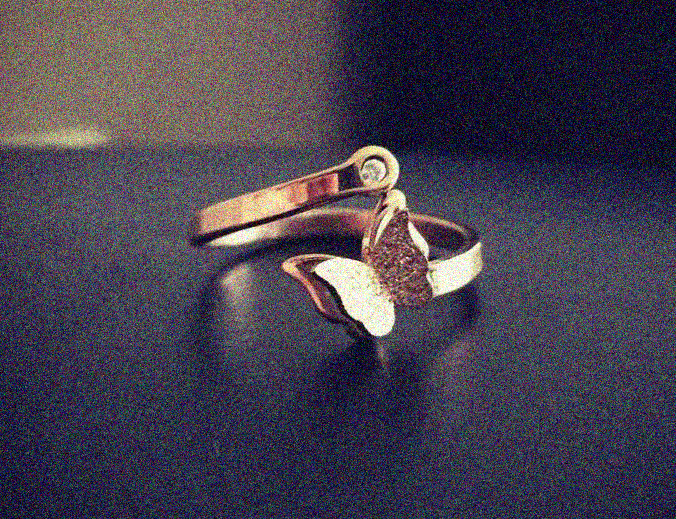

In [ ]:
#Displaying image with AWGN added
cv2_imshow(AWGN(var))
image1b=AWGN(var)

In [ ]:
def unclippedAWGN(var):
  #Adding gaussian noise to each channel
  gaussian_noiser = np.random.normal(mean,var**0.5,(w,h))
  gaussian_noiseb = np.random.normal(mean,var**0.5,(w,h))
  gaussian_noiseg = np.random.normal(mean,var**0.5,(w,h))

  #Also printing image without clipping to show the difference
  noisyrnoclip = image1a[:,:,0] + gaussian_noiser
  noisybnoclip = image1a[:,:,1] + gaussian_noiseb
  noisygnoclip = image1a[:,:,2] + gaussian_noiseg

  #Displaying the unclipped image too 
  for i in range(w):
    for j in range(h):
        image1c[i,j,0]=noisyrnoclip[i,j]
        image1c[i,j,1]=noisybnoclip[i,j]
        image1c[i,j,2]=noisygnoclip[i,j]
  return image1c

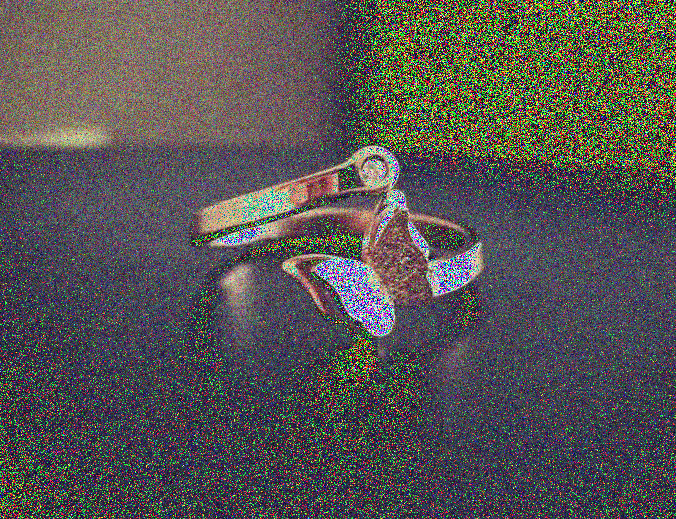

In [ ]:
#Displaying noisy image without clipping
cv2_imshow(unclippedAWGN(var))
image1c=unclippedAWGN(var)

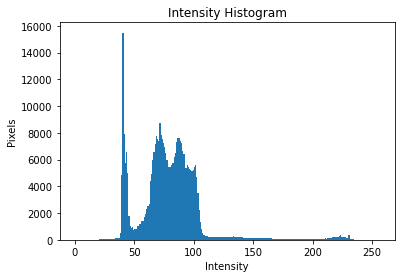

In [ ]:
import matplotlib.pyplot as plt

#Displaying the histogram of the original image
plt.hist(image1a[:,:,0].ravel(),256,[0,256])
plt.xlabel('Intensity')
plt.ylabel('Pixels')
plt.title('Intensity Histogram')
plt.show()

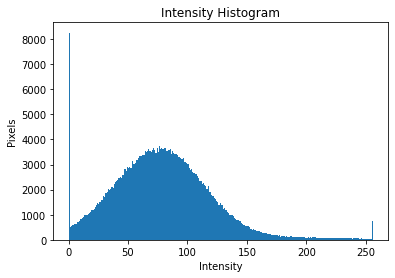

In [ ]:
import matplotlib.pyplot as plt

#Displaying the histogram of the noisy image
plt.hist(image1b[:,:,0].ravel(),256,[0,256])
plt.xlabel('Intensity')
plt.ylabel('Pixels')
plt.title('Intensity Histogram')
plt.show()

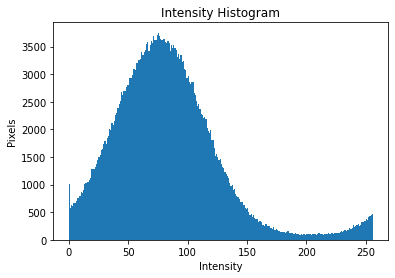

In [ ]:
import matplotlib.pyplot as plt

#Displaying the histogram of the unclipped noisy image
plt.hist(image1c[:,:,0].ravel(),256,[0,256])
plt.xlabel('Intensity')
plt.ylabel('Pixels')
plt.title('Intensity Histogram')
plt.show()

# Creating a restored image after adding AWGN and using hard thresholding for parts 1b and 1c

In [ ]:
#Noisy image with awgn
noisyimg=AWGN(var)


In [ ]:
#Importing libraries
import numpy as np
import matplotlib.pyplot as plt
import pywt
import cv2
from google.colab.patches import cv2_imshow
import math

In [ ]:
#Function for restoring using hard thresholding and wavelet transform
def hard_thresholding(img, thr = 0.2):
  #Discrete wavelet transform using haar fn
  coeffs_b = pywt.dwt2(img[:,:,0], 'haar')
  coeffs_g = pywt.dwt2(img[:,:,1], 'haar')
  coeffs_r = pywt.dwt2(img[:,:,2], 'haar')
  #separating the channels from coeffs
  LL_r, (LH_r, HL_r, HH_r) = coeffs_r
  LL_g, (LH_g, HL_g, HH_g) = coeffs_g
  LL_b, (LH_b, HL_b, HH_b) = coeffs_b
  
  #For each coefficient, applying the hard threshold
  for x in range(LH_r.shape[0]):
    for y in range(LH_r.shape[1]):
      if(abs(LH_r[x][y]) < thr):
        LH_r[x][y] = 0
      if(abs(LH_g[x][y]) < thr):
        LH_g[x][y] = 0
      if(abs(LH_b[x][y]) < thr):
        LH_b[x][y] = 0

  #For each coefficient, applying the hard threshold
  for x in range(HL_r.shape[0]):
    for y in range(HL_r.shape[1]):
      if(abs(HL_r[x][y]) < thr):
        HL_r[x][y] = 0
      if(abs(HL_g[x][y]) < thr):
        HL_g[x][y] = 0
      if(abs(HL_b[x][y]) < thr):
        HL_b[x][y] = 0

  #For each coefficient, applying the hard threshold
  for x in range(HH_r.shape[0]):
    for y in range(HH_r.shape[1]):
      if(abs(HH_r[x][y]) < thr):
        HH_r[x][y] = 0
      if(abs(HH_g[x][y]) < thr):
        HH_g[x][y] = 0
      if(abs(HH_b[x][y]) < thr):
        HH_b[x][y] = 0

  #Taking inverse discrete wavelet transform of the thresholded subbands
  red = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), 'haar')
  blue = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), 'haar')
  green = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), 'haar')
  
  #Merging the channels
  output = np.zeros((red.shape[0], red.shape[1], 3))
  output[:,:,0] = green
  output[:,:,1] = blue
  output[:,:,2] = red
  return output

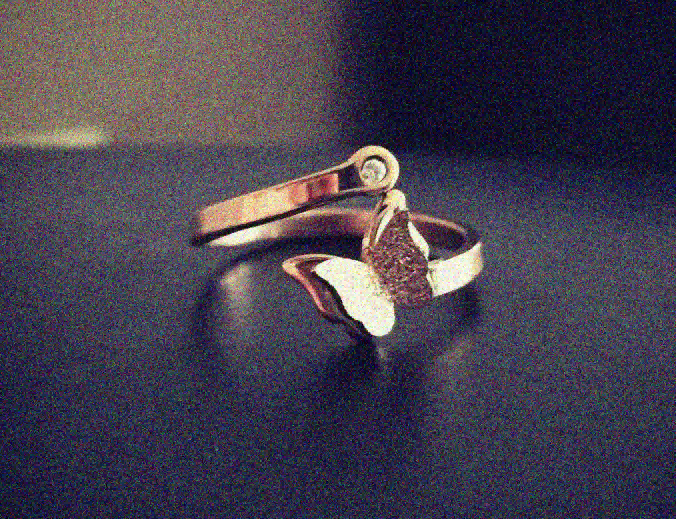

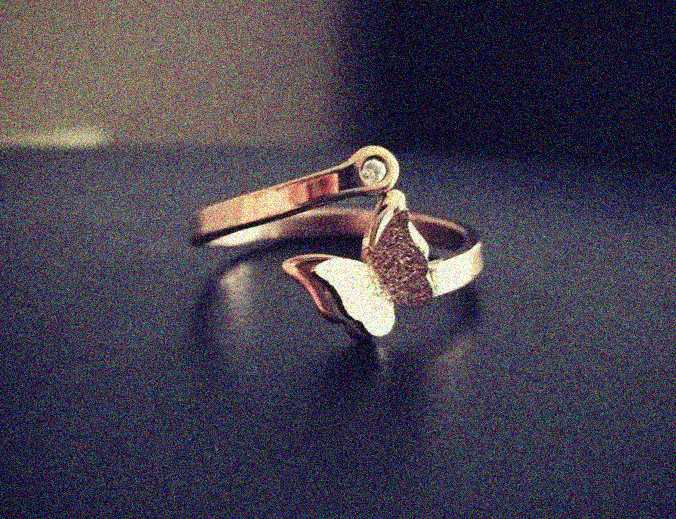

[[[ 1.42108547e-14  2.84217094e-14  5.68434189e-14]
  [ 0.00000000e+00  2.84217094e-14  2.84217094e-14]
  [ 0.00000000e+00  2.84217094e-14  5.68434189e-14]
  ...
  [ 3.55271368e-15  7.10542736e-15  4.44089210e-16]
  [ 1.42108547e-14  2.84217094e-14  1.77635684e-15]
  [ 1.42108547e-14  2.13162821e-14  0.00000000e+00]]

 [[ 1.42108547e-14  5.68434189e-14  5.68434189e-14]
  [ 0.00000000e+00  2.84217094e-14  2.84217094e-14]
  [ 2.84217094e-14  7.10542736e-15  3.55271368e-14]
  ...
  [ 2.84217094e-14  7.10542736e-15  0.00000000e+00]
  [ 1.42108547e-14  0.00000000e+00  0.00000000e+00]
  [-1.42108547e-14  0.00000000e+00  0.00000000e+00]]

 [[ 2.84217094e-14  5.68434189e-14  2.84217094e-14]
  [ 1.42108547e-14  2.84217094e-14  5.68434189e-14]
  [ 2.84217094e-14  0.00000000e+00  0.00000000e+00]
  ...
  [ 0.00000000e+00  1.42108547e-14  3.55271368e-15]
  [ 2.84217094e-14  0.00000000e+00  0.00000000e+00]
  [ 4.26325641e-14  0.00000000e+00  7.10542736e-15]]

 ...

 [[ 0.00000000e+00  0.00000000e+00

In [ ]:
#Displaying the restored image
cv2_imshow(hard_thresholding(noisyimg, thr = 50)[:w,:h,:])
#Displaying the noisy image
cv2_imshow(noisyimg)
#Printing the difference between the two images
print(hard_thresholding(noisyimg, thr = 0)[:w,:h,:]-noisyimg)


In [ ]:
#Saving the restored image for further use
restored=hard_thresholding(noisyimg, thr = 50)[:w,:h,:]

# b. Measure PSNR (with 255 as the default peak,but it should also be variable) between a restored image and a ground-truth image.Do not import a PSNR function directly,even if available.

In [ ]:
from math import log10, sqrt
def psnrfunc(image1a,restored,default_peak = 255.0):
  #Mean square error between ideal and noisy image
  mse = np.mean((image1a - restored) ** 2)
  #PSNR formula
  psnr = 20 * log10(default_peak / sqrt(mse))
  return psnr
  
#Using the function to print the psnr
print (psnrfunc(image1a,restored))

20.91098103931554


Reference: https://www.geeksforgeeks.org/python-peak-signal-to-noise-ratio-psnr/


# c. Measure SSIM (with power 1 for all three elements -- mean, variance, correlation -- which can bevaried too) between a restored and a ground-truth image. Do not import an SSIM function directly,even if available. 

In [ ]:
def ssimfunc(image1a,restored):
  #Means of two images
  xbar, ybar = image1a.mean(), restored.mean()
  #Variances of the two images
  vara= np.sum((image1a - xbar)**2)/(len(image1a) - 1)
  varb= np.sum((restored - ybar)**2)/(len(image1a) - 1)
  #Covariance of the two images
  covar= np.sum((image1a - xbar)*(restored - ybar))/(len(image1a) - 1)
  ssim= 2*xbar*ybar*2*covar/((xbar**2+ybar**2)*(vara+varb))
  return ssim
  
#Using the function to print the psnr
print (ssimfunc(image1a,restored))

0.8551272359914932


Reference:
https://medium.com/srm-mic/all-about-structural-similarity-index-ssim-theory-code-in-pytorch-6551b455541e


# d. Isotropic Gaussian blurring (Gaussian low pass filtering) of an image for a given variance.

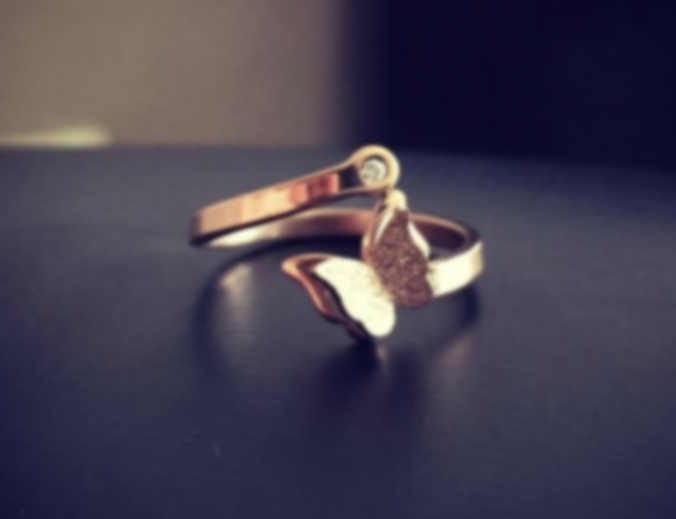

In [ ]:
#initialize variance
var=2
#importing required libraries
import scipy as sp
from scipy import stats
def GLPF(varr,image1a):

  #Making a kernel of 15*15
  x_data = np.arange(0, 15, 1)
  y_data = np.arange(0, 15, 1)
  z_data=np.zeros((15,15))

  for i in range(15):
   for j in range (15):
     #2d gaussian is a product of two 1d gaussians (x and y)
     z_data[i,j] = stats.norm.pdf(x_data[i], 7, varr)*stats.norm.pdf(y_data[j], 7, varr)
  
  #scaling z_data up to 255 as max to be able to see the kernel
  z_data=z_data*(255/z_data.max())
  #displaying the gaussian kernel
  cv2_imshow(z_data)
  #finding sum of all elements of kernel
  sum=0
  for i in range(15):
   for j in range(15):    
     sum=sum+z_data[i,j]
  #Sum of elements of kernel must be 1
  z_data=z_data/sum
  #Convolving the filter over the image
  image1d = cv2.filter2D(image1a, -1, z_data)
  return image1d

#printing the image after glpf
cv2_imshow(GLPF(var,image1a))

In [ ]:
#Process of experimentation to make the gaussian kernel
import scipy as sp
from scipy import stats
x_data = np.arange(0, 15, 1)
y_data = np.arange(0, 15, 1)
z_data=np.zeros((15,15))
for i in range(15):
  for j in range (15):
    z_data[i,j] = stats.norm.pdf(x_data[i], 7, varr)*stats.norm.pdf(y_data[j], 7, varr)
print(z_data.max())
z_data=z_data*6375
print(z_data.max())
#We can see the gaussian nature of the kernel
print(np.rint(z_data))
cv2_imshow(z_data)



0.039788735772973836
253.6531905527082
[[  0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.
    0.]
 [  0.   0.   0.   0.   1.   2.   2.   3.   2.   2.   1.   0.   0.   0.
    0.]
 [  0.   0.   0.   2.   4.   7.  10.  11.  10.   7.   4.   2.   0.   0.
    0.]
 [  0.   0.   2.   5.  11.  21.  30.  34.  30.  21.  11.   5.   2.   0.
    0.]
 [  0.   1.   4.  11.  27.  50.  73.  82.  73.  50.  27.  11.   4.   1.
    0.]
 [  0.   2.   7.  21.  50.  93. 136. 154. 136.  93.  50.  21.   7.   2.
    0.]
 [  0.   2.  10.  30.  73. 136. 198. 224. 198. 136.  73.  30.  10.   2.
    0.]
 [  1.   3.  11.  34.  82. 154. 224. 254. 224. 154.  82.  34.  11.   3.
    1.]
 [  0.   2.  10.  30.  73. 136. 198. 224. 198. 136.  73.  30.  10.   2.
    0.]
 [  0.   2.   7.  21.  50.  93. 136. 154. 136.  93.  50.  21.   7.   2.
    0.]
 [  0.   1.   4.  11.  27.  50.  73.  82.  73.  50.  27.  11.   4.   1.
    0.]
 [  0.   0.   2.   5.  11.  21.  30.  34.  30.  21.  11.   5.   2.   0.
    0.]
 

# Question 2

# a. Hard thresholding: set to zero any detail (LH, HL, HH) coefficient that is below a threshold (thresholdshould be variable)

In [ ]:
def hard_thresholding(img, thr = 0.2):
  #Discrete wavelet transform using haar fn
  coeffs_b = pywt.dwt2(img[:,:,0], 'haar')
  coeffs_g = pywt.dwt2(img[:,:,1], 'haar')
  coeffs_r = pywt.dwt2(img[:,:,2], 'haar')
  #separating the channels from coeffs
  LL_r, (LH_r, HL_r, HH_r) = coeffs_r
  LL_g, (LH_g, HL_g, HH_g) = coeffs_g
  LL_b, (LH_b, HL_b, HH_b) = coeffs_b

  #For each coefficient, applying the hard threshold
  for x in range(LH_r.shape[0]):
    for y in range(LH_r.shape[1]):
      if(abs(LH_r[x][y]) < thr):
        LH_r[x][y] = 0
      if(abs(LH_g[x][y]) < thr):
        LH_g[x][y] = 0
      if(abs(LH_b[x][y]) < thr):
        LH_b[x][y] = 0

  #For each coefficient, applying the hard threshold
  for x in range(HL_r.shape[0]):
    for y in range(HL_r.shape[1]):
      if(abs(HL_r[x][y]) < thr):
        HL_r[x][y] = 0
      if(abs(HL_g[x][y]) < thr):
        HL_g[x][y] = 0
      if(abs(HL_b[x][y]) < thr):
        HL_b[x][y] = 0

  #For each coefficient, applying the hard threshold
  for x in range(HH_r.shape[0]):
    for y in range(HH_r.shape[1]):
      if(abs(HH_r[x][y]) < thr):
        HH_r[x][y] = 0
      if(abs(HH_g[x][y]) < thr):
        HH_g[x][y] = 0
      if(abs(HH_b[x][y]) < thr):
        HH_b[x][y] = 0

  #Taking inverse discrete wavelet transform of the thresholded subbands
  red = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), 'haar')
  blue = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), 'haar')
  green = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), 'haar')
  
  #Merging the channels
  output = np.zeros((red.shape[0], red.shape[1], 3))
  output[:,:,0] = green
  output[:,:,1] = blue
  output[:,:,2] = red
  return output

In [ ]:
#We want to make sure that the output for different thresholds is different so printing it
noisyimg=AWGN(200)
temp1 = hard_thresholding(noisyimg, thr = 0)[:w,:h,:]-noisyimg
temp2 = hard_thresholding(noisyimg, thr = 10)[:w,:h,:]-noisyimg
print(temp1 - temp2)
a=temp1-temp2

[[[ 7.50000000e-01  0.00000000e+00  0.00000000e+00]
  [-7.50000000e-01  0.00000000e+00 -6.50000000e+00]
  [-1.75000000e+00 -1.00000000e+00  0.00000000e+00]
  ...
  [-1.00000000e+00 -5.00000000e+00 -2.00000000e+00]
  [ 0.00000000e+00 -1.00000000e+00 -4.75000000e+00]
  [-7.10542736e-15 -1.00000000e+00  2.25000000e+00]]

 [[ 7.50000000e-01  0.00000000e+00  6.50000000e+00]
  [-7.50000000e-01  0.00000000e+00  0.00000000e+00]
  [-1.75000000e+00  1.00000000e+00  0.00000000e+00]
  ...
  [ 1.00000000e+00  4.00000000e+00  2.00000000e+00]
  [ 5.00000000e-01 -1.00000000e+00  7.25000000e+00]
  [-5.00000000e-01  3.00000000e+00 -4.75000000e+00]]

 [[-6.00000000e+00 -2.50000000e+00  2.50000000e+00]
  [-2.00000000e+00  2.50000000e+00  5.50000000e+00]
  [-6.00000000e+00  0.00000000e+00 -1.00000000e+00]
  ...
  [-7.50000000e+00 -4.50000000e+00  1.50000000e+00]
  [ 1.50000000e+00  2.00000000e+00  0.00000000e+00]
  [-6.00000000e+00 -2.00000000e+00 -6.00000000e+00]]

 ...

 [[-5.00000000e-01  0.00000000e+00

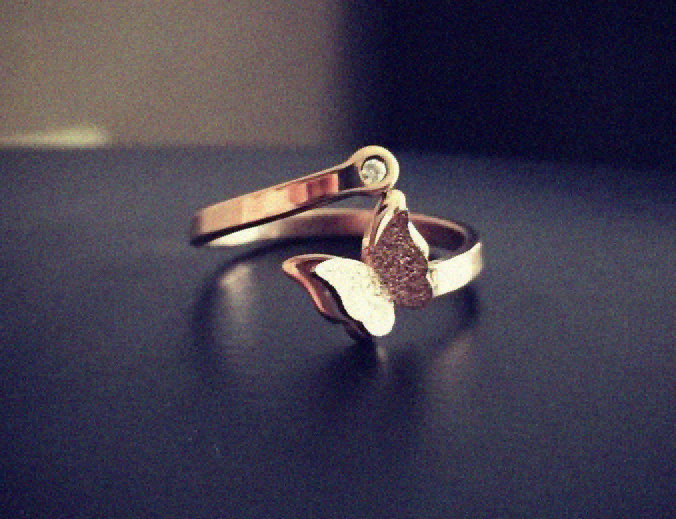

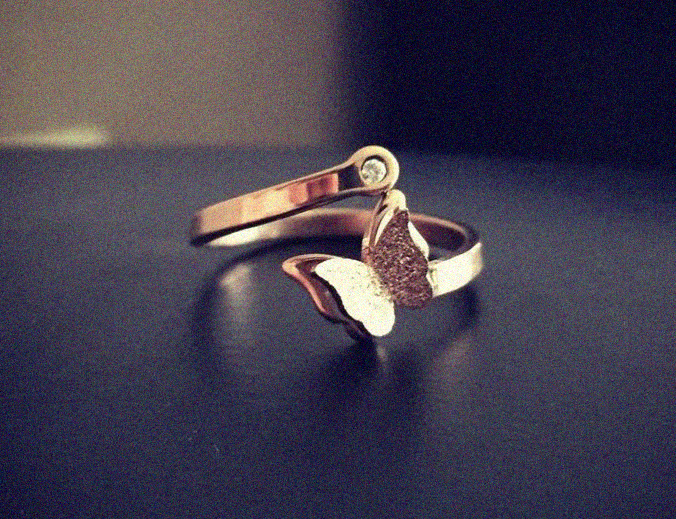

In [ ]:
#Displaying the restored and original image after hard thresholding
cv2_imshow(hard_thresholding(noisyimg, thr = 50)[:w,:h,:])
cv2_imshow(noisyimg)

# b. Soft thresholding: set to zero any detail (LH, HL, HH) coefficient that is below a threshold (thresholdshould be variable), and subtract the threshold from those that are above the threshold.

In [ ]:
def soft_thresholding(img, thr = 0.2):
  #Discrete wavelet transform using haar fn
  coeffs_b = pywt.dwt2(img[:,:,0], 'haar')
  coeffs_g = pywt.dwt2(img[:,:,1], 'haar')
  coeffs_r = pywt.dwt2(img[:,:,2], 'haar')
  #separating the channels from coeffs
  LL_r, (LH_r, HL_r, HH_r) = coeffs_r
  LL_g, (LH_g, HL_g, HH_g) = coeffs_g
  LL_b, (LH_b, HL_b, HH_b) = coeffs_b
  
  #For each coefficient, applying the soft threshold
  for x in range(LH_r.shape[0]):
    for y in range(LH_r.shape[1]):
      if(abs(LH_r[x][y]) < thr):
        LH_r[x][y] = 0
      if(abs(LH_g[x][y]) < thr):
        LH_g[x][y] = 0
      if(abs(LH_b[x][y]) < thr):
        LH_b[x][y] = 0
      # Adding threshold if value less than -threshold
      if(LH_r[x][y] < -thr):
        LH_r[x][y] = LH_r[x][y] + thr
      if(LH_g[x][y] < -thr):
        LH_g[x][y] = LH_g[x][y] + thr
      if(LH_b[x][y] < -thr):
        LH_b[x][y] = LH_b[x][y] + thr
      # Subtracting threshold if value more than threshold
      if(LH_r[x][y] > thr):
        LH_r[x][y] = LH_r[x][y] - thr
      if(LH_g[x][y] > thr):
        LH_g[x][y] = LH_g[x][y] - thr
      if(LH_b[x][y] > thr):
        LH_b[x][y] = LH_b[x][y] - thr

  #For each coefficient, applying the soft threshold
  for x in range(HL_r.shape[0]):
    for y in range(HL_r.shape[1]):
      if(abs(HL_r[x][y]) < thr):
        HL_r[x][y] = 0
      if(abs(HL_g[x][y]) < thr):
        HL_g[x][y] = 0
      if(abs(HL_b[x][y]) < thr):
        HL_b[x][y] = 0
      # Adding threshold if value less than -threshold
      if(HL_r[x][y] < -thr):
        HL_r[x][y] = HL_r[x][y] + thr
      if(HL_g[x][y] < -thr):
        HL_g[x][y] = HL_g[x][y] + thr
      if(HL_b[x][y] < -thr):
        HL_b[x][y] = HL_b[x][y] + thr
      # Subtracting threshold if value more than threshold
      if(HL_r[x][y] > thr):
        HL_r[x][y] = HL_r[x][y] - thr
      if(HL_g[x][y] > thr):
        HL_g[x][y] = HL_g[x][y] - thr
      if(HL_b[x][y] > thr):
        HL_b[x][y] = HL_b[x][y] - thr

  #For each coefficient, applying the soft threshold
  for x in range(HH_r.shape[0]):
    for y in range(HH_r.shape[1]):
      if(abs(HH_r[x][y]) < thr):
        HH_r[x][y] = 0
      if(abs(HH_g[x][y]) < thr):
        HH_g[x][y] = 0
      if(abs(HH_b[x][y]) < thr):
        HH_b[x][y] = 0
      # Adding threshold if value less than -threshold
      if(HH_r[x][y] < -thr):
        HH_r[x][y] = HH_r[x][y] + thr
      if(HH_g[x][y] < -thr):
        HH_g[x][y] = HH_g[x][y] + thr
      if(HH_b[x][y] < -thr):
        HH_b[x][y] = HH_b[x][y] + thr
      # Subtracting threshold if value more than threshold
      if(HH_r[x][y] > thr):
        HH_r[x][y] = HH_r[x][y] - thr
      if(HH_g[x][y] > thr):
        HH_g[x][y] = HH_g[x][y] - thr
      if(HH_b[x][y] > thr):
        HH_b[x][y] = HH_b[x][y] - thr

  #Taking inverse discrete wavelet transform of the thresholded subbands
  red = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), 'haar')
  blue = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), 'haar')
  green = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), 'haar')
  
  #Merging the channels
  output = np.zeros((red.shape[0], red.shape[1], 3))
  output[:,:,0] = green
  output[:,:,1] = blue
  output[:,:,2] = red
  return output

In [ ]:
#We want to make sure that the output for different thresholds is different so printing it
temp1 = soft_thresholding(noisyimg, thr = 0)[:w,:h,:]-noisyimg
temp2 = soft_thresholding(noisyimg, thr = 10)[:w,:h,:]-noisyimg
print(temp1 - temp2)
b=temp1-temp2

[[[ 1.07500000e+01  5.00000000e+00 -5.00000000e+00]
  [-7.50000000e-01 -1.50000000e+01 -1.50000000e+00]
  [-1.17500000e+01 -6.00000000e+00  5.00000000e+00]
  ...
  [ 9.00000000e+00 -1.77635684e-15 -7.00000000e+00]
  [ 5.00000000e+00 -1.00000000e+00 -4.75000000e+00]
  [ 5.00000000e+00 -1.00000000e+00  2.25000000e+00]]

 [[-9.25000000e+00  5.00000000e+00  1.15000000e+01]
  [-7.50000000e-01  5.00000000e+00 -5.00000000e+00]
  [ 8.25000000e+00 -4.00000000e+00  5.00000000e+00]
  ...
  [ 1.00000000e+00 -1.00000000e+00 -3.00000000e+00]
  [-4.50000000e+00 -1.00000000e+00  7.25000000e+00]
  [-5.50000000e+00  3.00000000e+00 -4.75000000e+00]]

 [[-1.00000000e+00 -7.50000000e+00  7.50000000e+00]
  [-7.00000000e+00 -2.50000000e+00  5.00000000e-01]
  [-1.10000000e+01  5.00000000e+00 -6.00000000e+00]
  ...
  [-2.50000000e+00 -9.50000000e+00  6.50000000e+00]
  [-3.50000000e+00  2.00000000e+00 -5.00000000e+00]
  [-1.00000000e+00 -2.00000000e+00 -1.00000000e+00]]

 ...

 [[ 4.50000000e+00  1.50000000e+01

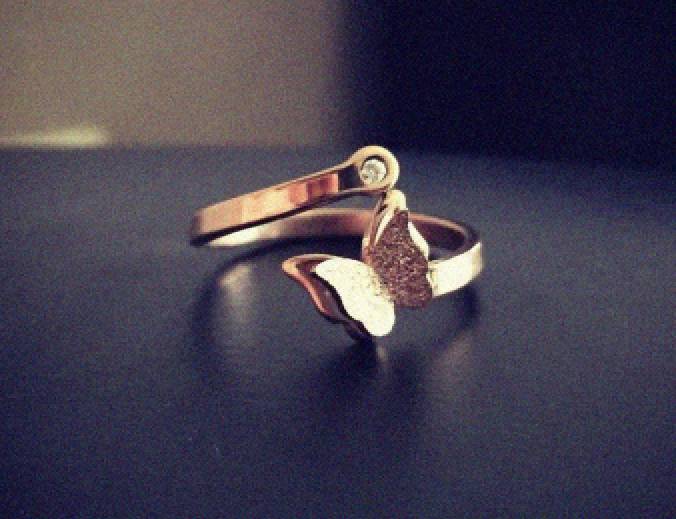

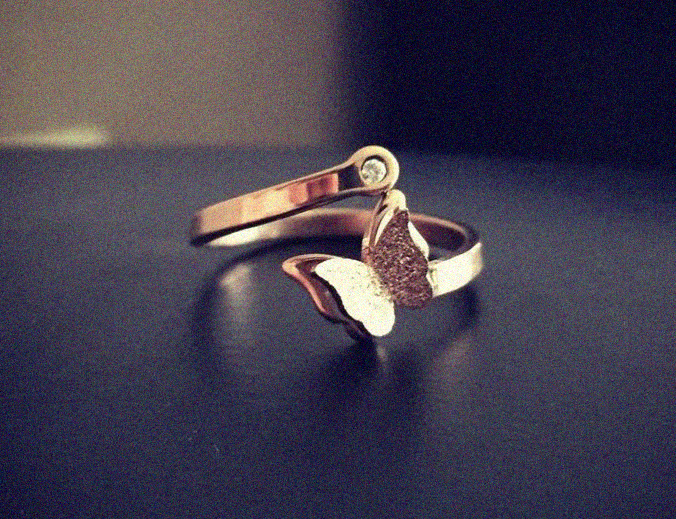

In [ ]:
#Displaying the restored and original image after hard thresholding
cv2_imshow(soft_thresholding(noisyimg, thr = 50)[:w,:h,:])
cv2_imshow(noisyimg)

# Comparing Soft and Hard Thresholding

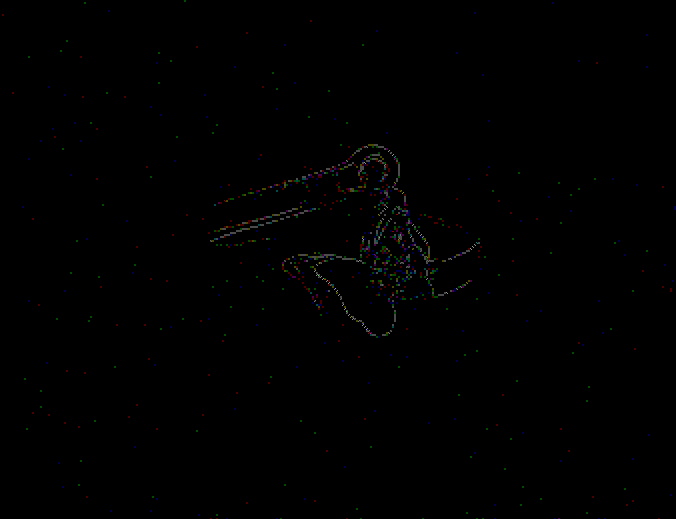

[[[-1.00000000e+01 -5.00000000e+00  5.00000000e+00]
  [ 0.00000000e+00  1.50000000e+01 -5.00000000e+00]
  [ 1.00000000e+01  5.00000000e+00 -5.00000000e+00]
  ...
  [-1.00000000e+01 -5.00000000e+00  5.00000000e+00]
  [-5.00000000e+00  0.00000000e+00  0.00000000e+00]
  [-5.00000000e+00  0.00000000e+00  0.00000000e+00]]

 [[ 1.00000000e+01 -5.00000000e+00 -5.00000000e+00]
  [ 0.00000000e+00 -5.00000000e+00  5.00000000e+00]
  [-1.00000000e+01  5.00000000e+00 -5.00000000e+00]
  ...
  [-3.55271368e-15  5.00000000e+00  5.00000000e+00]
  [ 5.00000000e+00  0.00000000e+00  0.00000000e+00]
  [ 5.00000000e+00  0.00000000e+00  0.00000000e+00]]

 [[-5.00000000e+00  5.00000000e+00 -5.00000000e+00]
  [ 5.00000000e+00  5.00000000e+00  5.00000000e+00]
  [ 5.00000000e+00 -5.00000000e+00  5.00000000e+00]
  ...
  [-5.00000000e+00  5.00000000e+00 -5.00000000e+00]
  [ 5.00000000e+00  0.00000000e+00  5.00000000e+00]
  [-5.00000000e+00  0.00000000e+00 -5.00000000e+00]]

 ...

 [[-5.00000000e+00 -1.50000000e+01

In [ ]:
#We want to make sure that hard and soft thresholding gives different rsults so displaying their difference
cv2_imshow(abs(hard_thresholding(noisyimg, thr = 50)[:w,:h,:]-soft_thresholding(noisyimg, thr = 50)[:w,:h,:])*3)
#Just to check that this is non zero
print(a-b)

# c. The method proposed in the paper “Image Denoising using Neighbouring Wavelet Coefficients” byChen et al.

This was the first try, a little inefficient code, it is optimised in the next cell

In [ ]:
# def paper_method(img, var = 0.1, n = 3):
#   thr = (var**0.5)*math.sqrt(2*math.log(w*h,10))

#   coeffs_b = pywt.dwt2(img[:,:,0], 'haar')
#   coeffs_g = pywt.dwt2(img[:,:,1], 'haar')
#   coeffs_r = pywt.dwt2(img[:,:,2], 'haar')
#   LL_r, (LH_r, HL_r, HH_r) = coeffs_r
#   LL_g, (LH_g, HL_g, HH_g) = coeffs_g
#   LL_b, (LH_b, HL_b, HH_b) = coeffs_b
#   padlhr=np.pad(LH_r,1)
#   padhlr=np.pad(HL_r,1)
#   padhhr=np.pad(HH_r,1)
#   padlhb=np.pad(LH_b,1)
#   padhlb=np.pad(HL_b,1)
#   padhhb=np.pad(HH_b,1)
#   padlhg=np.pad(LH_g,1)
#   padhlg=np.pad(HL_g,1)
#   padhhg=np.pad(HH_g,1)
#   padllr=np.pad(LL_r,1)
#   padllb=np.pad(LL_b,1)
#   padllg=np.pad(LL_g,1)

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padlhr[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padlhr[x,y] *= beta
#       else:
#         padlhr[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhlr[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhlr[x,y] *= beta
#       else:
#         padhlr[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhhr[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhhr[x,y] *= beta
#       else:
#         padhhr[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padlhg[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padlhg[x,y] *= beta
#       else:
#         padlhg[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhlg[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhlg[x,y] *= beta
#       else:
#         padhlg[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhhg[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhhg[x,y] *= beta
#       else:
#         padhhg[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padlhb[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padlhb[x,y] *= beta
#       else:
#         padlhb[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhlb[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhlb[x,y] *= beta
#       else:
#         padhlb[x,y] = 0

#   for x in range(0, LL_r.shape[0] ):
#     for y in range(0,LL_r.shape[1] ):
#       s2_sum = 0
#       for i in range(0,3):
#         for j in range(0,3):
#           s2_sum += padhhb[x+i][y+j]**2
#       beta = 1 - thr**2/s2_sum
#       if(beta > 0):
#         padhhb[x,y] *= beta
#       else:
#         padhhb[x,y] = 0

#   coeffs_r = padllr, (padlhr, padhlr, padhhr) 
#   coeffs_g = padllg, (padlhg, padhlg, padhhg) 
#   coeffs_b = padllb, (padlhb, padhlb, padhhb) 
#   img= np.zeros((524,680,3))
#   img[:,:,0] = pywt.idwt2(coeffs_b, 'haar')
#   img[:,:,1] = pywt.idwt2(coeffs_g, 'haar')
#   img[:,:,2] = pywt.idwt2(coeffs_r, 'haar')

#   return img
  

In [ ]:
def denoising(subband, thr, n):
  #Zero padding the image so that the filter can be applied to all the pixels
  subband = np.pad(subband, n//2)
  w, h = subband.shape[0], subband.shape[1]
  # for each pixel calculating the s2 for a 3x3 kernel around it
  for x in range(n//2, w-n//2):
    for y in range(n//2, h-n//2):
      s2_sum = 0
      for i in range(-n//2,n//2+1):
        for j in range(-n//2,n//2+1):
          s2_sum = s2_sum + (subband[x+i][y+j])**2
      beta = 1 - thr**2/s2_sum
      #If the factor is more than zero then we multiply or else we reduce the coeff
      # to zero. 
      if(beta > 0):
        subband[x][y] = subband[x][y]*beta
      else:
        subband[x][y] = 0
  #removing the padded pixels and returning the original coefficients after beign passed 
  #through the thrsholding conditions
  subband2 = subband[n//2:w-n//2, n//2:h-n//2]
  return subband2

def chen_method_channel(channel, var, n):
  #The donoho threshold for an image
  thr = (var**0.5)*math.sqrt(2*math.log(channel.shape[0]*channel.shape[1]))
  #Finding the discrete wavelet coefficients for the haar function
  coeffs = pywt.dwt2(channel, 'haar')
  LL, (LH, HL, HH) = coeffs
  #Applying the denoising condition to each subband of the image
  LH = denoising(LH, thr, n)
  HL = denoising(HL, thr, n)
  HH = denoising(HH, thr, n)
  #Taking the inverse discrete wavelet transform of the thresholded subbands
  channel = pywt.idwt2((LL, (LH, HL, HH)), 'haar')
  return channel

def chen_for_image(img, var = 0.1, n = 3):
  #Breaking the image into three channels to apply the chen et al condition on
  # each color channel
  red = img[:,:,2]
  blue = img[:,:,1]
  green = img[:,:,0]

  red = chen_method_channel(red, var, n)
  blue = chen_method_channel(blue, var, n)
  green = chen_method_channel(green, var, n)
  # Combining the three channels back to form the colored image
  output = np.zeros((red.shape[0], red.shape[1], 3))
  output[:,:,0] = green
  output[:,:,1] = blue
  output[:,:,2] = red
  return output

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  if sys.path[0] == '':


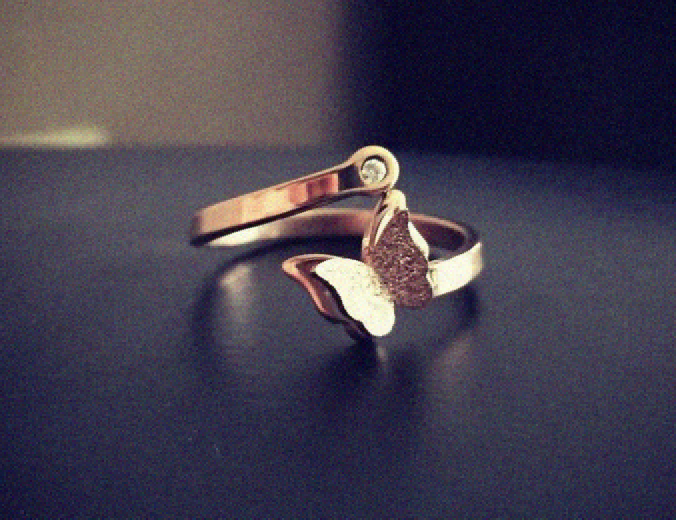

In [ ]:
#Chen Method for a noisy image of noise variance = 200
cv2_imshow(chen_for_image(image1b, 200, 3))

In [ ]:
#Using different variances and showing that the result is different
temp1=chen_for_image(image1b, 1000, 3)
temp2=chen_for_image(image1b, 1, 3)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  if sys.path[0] == '':


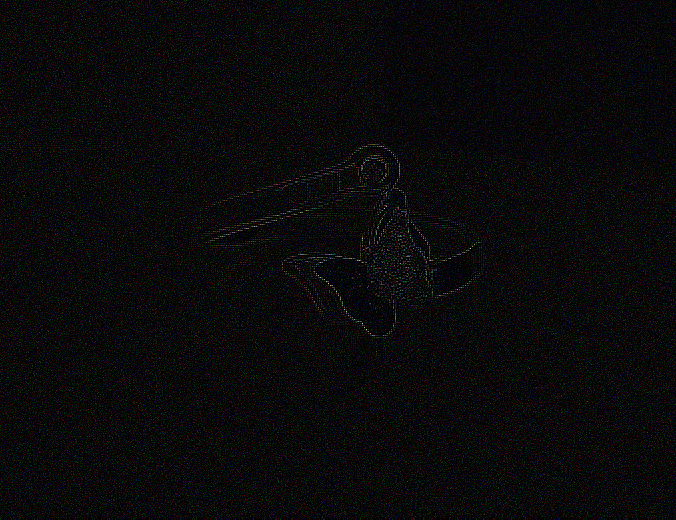

In [ ]:
#The difference of the two results
cv2_imshow((temp1-temp2)*2)

# Question 3

# a. Noise variance

In [ ]:
#Variance list
vari=[100,200,300,400,500,600,700,800,900,1000]
#Arrays to store psnr and ssim
psnri=[]
ssimi=[]

In [ ]:
for i in range(1,11):
  #Setting variance for awgn
  var=i*100
  #Adding Awgn
  image1b=AWGN(var)
  #Finding psnr
  psnr=psnrfunc(image1a,image1b)
  psnri.append(psnr)
  #finding ssim
  ssim=ssimfunc(image1a,image1b)
  ssimi.append(ssim)
print(psnri)
print(ssimi)

[30.31444341517612, 29.34356533950163, 28.9427542847814, 28.71463070896275, 28.55677859250123, 28.442448285239117, 28.36152618144054, 28.289985108230677, 28.23075934505217, 28.190602380917312]
[0.9709818878606595, 0.9438737810343869, 0.9186877687056733, 0.8948289605225225, 0.8724859664555749, 0.8518165132057846, 0.8315110570095022, 0.8120787805454136, 0.794898508814861, 0.7772473794559972]


Text(0.5, 1.0, 'PSNR vs variance of AWGN')

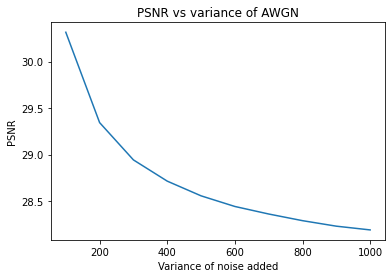

In [ ]:
#Plotting psnr vs var
plt.plot(vari, psnri)
plt.xlabel("Variance of noise added")
plt.ylabel("PSNR")
plt.title("PSNR vs variance of AWGN")

Text(0.5, 1.0, 'SSIM vs variance of AWGN')

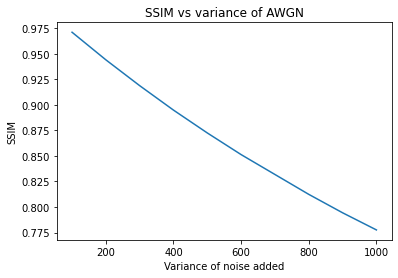

In [ ]:
#Plotting ssim vs var
plt.plot(vari, ssimi)
plt.xlabel("Variance of noise added")
plt.ylabel("SSIM")
plt.title("SSIM vs variance of AWGN")

# b. Gaussian low pass filtering with various variances

In [ ]:
#Variance list
vari=[1,2,3,4,5,6,7,8,9,10]
#Arrays to store psnr and ssim
psnri=[]
ssimi=[]

In [ ]:
for i in range(1,11):
  #Setting variance for awgn
  varr=i
  #Adding glpf
  image1b= GLPF(varr,image1a)
  #Finding psnr
  psnr=psnrfunc(image1a,image1b)
  psnri.append(psnr)
  #finding ssim
  ssim=ssimfunc(image1a,image1b)
  ssimi.append(ssim)
print(psnri)
print(ssimi)


[41.542225697780246, 39.079326267675896, 38.08770597761317, 37.647244023200805, 37.41281570659191, 37.293468053758545, 37.20552575294058, 37.169068528712764, 37.14139013690944, 37.10951765194418]
[0.9963282959505989, 0.9875185253568712, 0.9784141064980769, 0.9716308086454735, 0.9673667978017972, 0.9647177323378902, 0.9630109418524417, 0.9618539398895254, 0.9610444115117738, 0.9604575846999992]


Text(0.5, 1.0, 'PSNR vs variance of GLPF')

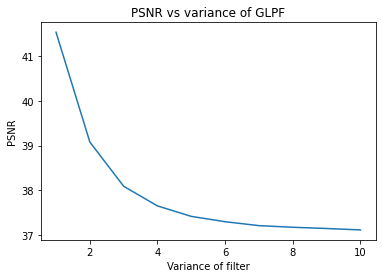

In [ ]:
#Plotting psnr vs var
plt.plot(vari, psnri)
plt.xlabel("Variance of filter")
plt.ylabel("PSNR")
plt.title("PSNR vs variance of GLPF")

Text(0.5, 1.0, 'SSIM vs variance of GLPF')

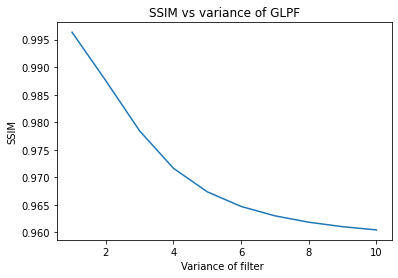

In [ ]:
#Plotting ssim vs var
plt.plot(vari, ssimi)
plt.xlabel("Variance of filter ")
plt.ylabel("SSIM")
plt.title("SSIM vs variance of GLPF")

# c. The two thresholding methods, where threshold is given by λ =𝜎 2 log 𝑛2(as suggested byDonoho et al.), where 𝜎 is noise variance, and 𝑛 is window size.

HARD THRESHOLDING





In [ ]:
#Arrays to hold 
psnri=[]
ssimi=[]

In [ ]:
from math import log10, sqrt

for i in range(1,11):
  #Setting variance for awgn
  var=i*100
  #Adding Awgn
  image1b=AWGN(var)
  #Setting threshold using Donoho's formula
  thr=(var**0.5)*math.sqrt(2*math.log(w*h))
  temp1 = hard_thresholding(image1b, thr)
  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  psnri.append(psnr)
  #finding ssim
  ssim=ssimfunc(image1a,temp1[:w,:h,:])
  ssimi.append(ssim)
print(psnri)
print(ssimi)

[32.743614100051545, 30.218975534315003, 28.722828627479714, 27.64090458399795, 26.8175831208099, 26.117470089983517, 25.533912266257232, 25.03222293502263, 24.600762230468135, 24.20760404489506]
[0.9895138820361954, 0.981196697137392, 0.9734935601831431, 0.9660292419795511, 0.9590482929611687, 0.9519852122792078, 0.9451668413706797, 0.9385481364717237, 0.9323672446476745, 0.9260477230953212]


Text(0.5, 1.0, 'PSNR vs variance of Hard Thresholding')

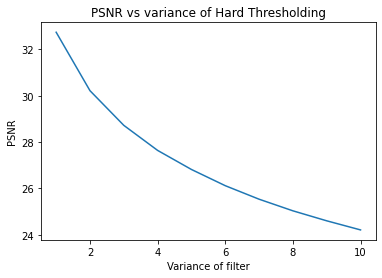

In [ ]:
#plorring psnr vs var
plt.plot(vari, psnri)
plt.xlabel("Variance of filter")
plt.ylabel("PSNR")
plt.title("PSNR vs variance of Hard Thresholding")

Text(0.5, 1.0, 'SSIM vs variance of Hard Thresholding')

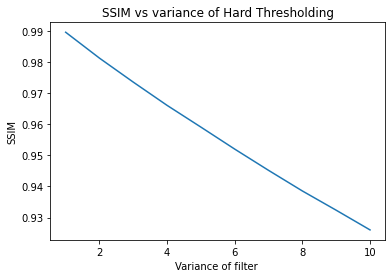

In [ ]:
#plotting ssim vs var
plt.plot(vari, ssimi)
plt.xlabel("Variance of filter ")
plt.ylabel("SSIM")
plt.title("SSIM vs variance of Hard Thresholding")

SOFT THRESHOLDING

In [ ]:
#Arrays to hold 
psnri=[]
ssimi=[]

In [ ]:
from math import log10, sqrt

for i in range(1,11):
  #Setting variance for awgn
  var=i*100
  #Adding Awgn
  image1b=AWGN(var)
  #Setting threshold using Donoho's formula
  thr=(var**0.5)*math.sqrt(2*math.log(w*h))
  temp1 = soft_thresholding(image1b, thr)
  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  psnri.append(psnr)
  #finding ssim
  ssim=ssimfunc(image1a,temp1[:w,:h,:])
  ssimi.append(ssim)
print(psnri)
print(ssimi)

[32.32209261964273, 30.02428872585696, 28.613383686636453, 27.593024562880004, 26.762132408453162, 26.092248090587823, 25.548434954965874, 25.019537897507472, 24.60975214349533, 24.192803860656188]
[0.9884083284168933, 0.9803190382359439, 0.972779611936848, 0.9656333970651221, 0.9584649644063866, 0.9516158965040488, 0.9452852596520974, 0.938370295942913, 0.932388978526472, 0.9257891912319296]


Text(0.5, 1.0, 'PSNR vs variance of Soft Thresholding')

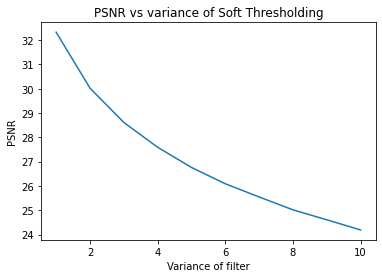

In [ ]:
#plorring psnr vs var
plt.plot(vari, psnri)
plt.xlabel("Variance of filter")
plt.ylabel("PSNR")
plt.title("PSNR vs variance of Soft Thresholding")

Text(0.5, 1.0, 'SSIM vs variance of Soft Thresholding')

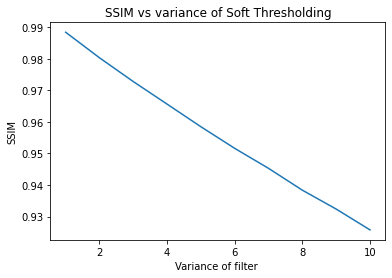

In [ ]:
#plotting ssim vs var
plt.plot(vari, ssimi)
plt.xlabel("Variance of filter ")
plt.ylabel("SSIM")
plt.title("SSIM vs variance of Soft Thresholding")

# d. The method of Chen et al

In [ ]:
#Arrays to store psnr and ssim
qq=[]
ss=[]

In [ ]:
from math import log10, sqrt

for i in range(1,11):
  #Setting variance for awgn
  var=i*100
  #Adding Awgn
  image1b=AWGN(var)
  #Using chen for image function to restore
  temp1 = chen_for_image(image1b, var,3)
  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  qq.append(psnr)
  #finding ssim
  ssim=ssimfunc(image1a,temp1[:w,:h,:])
  ss.append(ssim)
print(qq)
print(ss)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in double_scalars
  if sys.path[0] == '':


[33.29667614150088, 30.548193434121366, 28.939415842620242, 27.760366014742814, 26.87970031863086, 26.180315614892592, 25.59423927557825, 25.06674562326884, 24.61579110013428, 24.22634271891232]
[0.990780185145729, 0.9825869870221768, 0.9748007583791723, 0.9669610256987327, 0.9595959089598424, 0.9526171793519089, 0.9458885141514377, 0.9390650657757109, 0.9325063788182513, 0.9263302867956305]


Text(0.5, 1.0, 'PSNR vs variance of Chen')

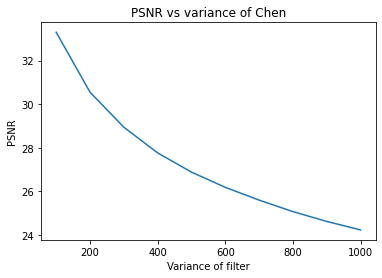

In [ ]:
#plotting psnr vs var
plt.plot(vari, qq)
plt.xlabel("Variance of filter")
plt.ylabel("PSNR")
plt.title("PSNR vs variance of Chen")

Text(0.5, 1.0, 'SSIM vs variance of Chen')

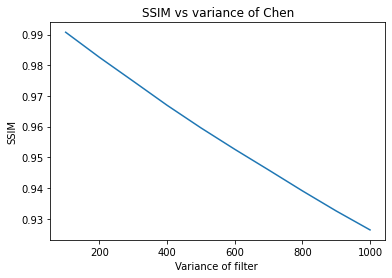

In [ ]:
#plotting ssim vs var
plt.plot(vari, ss)
plt.xlabel("Variance of filter ")
plt.ylabel("SSIM")
plt.title("SSIM vs variance of Chen")

# e. When the method is independently applied to RGB channels, versus when the method is applied to Ichannel of HSI transform.

In [ ]:
vari = [100*x for x in range(1,11)]

psnr_rgb = []
ssim_rgb = []
psnr_hsi = []
ssim_hsi = []

for i in range(1,11):
  #Setting variance for awgn
  var=i*100
  #Adding Awgn
  image1b=AWGN(var)
  #Using chen method for all three color channels in RGB
  restored_rgb = chen_for_image(image1b, var = var, n = 3)
  #Converting the image to HSI first and then applying the chen method
  #to the Intensity channel only and finally converting back to RGB
  restored_hsi = cv2.cvtColor(image1b, cv2.COLOR_BGR2HSV)
  restored_hsi[:,:,2] = chen_method_channel(restored_hsi[:,:,2], var = 1000, n = 3)[:w,:h]
  restored_hsi = cv2.cvtColor(restored_hsi, cv2.COLOR_HSV2BGR)
  
  #Finding psnr for rgb restored image
  psnr=psnrfunc(image1a,restored_rgb[:w,:h,:])
  psnr_rgb.append(psnr)
  #finding ssim for rgb restored image
  ssim=ssimfunc(image1a,restored_rgb[:w,:h,:])
  ssim_rgb.append(ssim)
  
  #Finding psnr for hsi restored image
  psnr=psnrfunc(image1a,restored_hsi[:w,:h,:])
  psnr_hsi.append(psnr)
  #finding ssim for hsi restored image
  ssim=ssimfunc(image1a,restored_hsi[:w,:h,:])
  ssim_hsi.append(ssim)

In [ ]:
#Printing the psnr and the ssim values for the rgb method and the hsi method
print(psnr_rgb)
print(psnr_hsi)
print(ssim_rgb)
print(ssim_hsi)

[33.28264229124896, 30.561472081053566, 28.922721440571916, 27.765406215375442, 26.91094710515926, 26.1799554475763, 25.57890251559785, 25.079693429828247, 24.623215219598276, 24.21475730571279]
[30.665235429811396, 29.64152699291219, 29.168906554273704, 28.87791666758111, 28.67957186100852, 28.531337880470232, 28.418486778111056, 28.329538648732353, 28.26207814688801, 28.203095258076512]
[0.9907427001793544, 0.9826416775461481, 0.9746849218076875, 0.9669772653539611, 0.9599121072970342, 0.95263400305693, 0.9457208947941577, 0.9391766503918548, 0.9326585190562312, 0.9261055988566207]
[0.9685507864051902, 0.9455121495553346, 0.9243763782964224, 0.9043420371395, 0.8858697291472191, 0.8681978678243586, 0.8512894767598737, 0.8354932165493834, 0.8207438911742472, 0.8052242707412046]


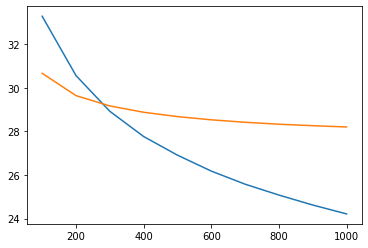

In [ ]:
#Plotting the PSNR versus the variance
plt.plot(vari, psnr_rgb)
plt.plot(vari, psnr_hsi)
plt.show()

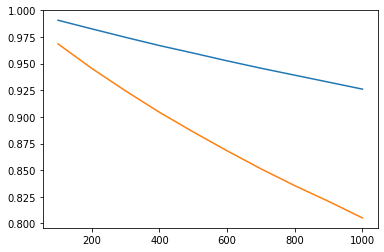

In [ ]:
#Plotting the SSIM versus the variance
plt.plot(vari, ssim_rgb)
plt.plot(vari, ssim_hsi)
plt.show()

# Question 4

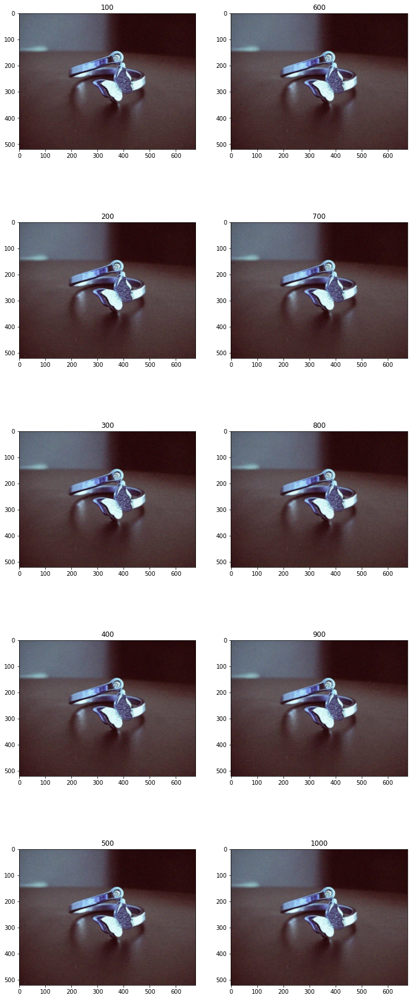

In [ ]:
from math import log10, sqrt
var_hidden = np.random.randint(100, 1000)
psnr_list = []

figure, axes = plt.subplots(5,2, figsize = (12,32))
for ii in range(1,11):
  #Setting variance for restoration functions
  var=ii*100
  #Adding Awgn with an unknown variance
  image1b=AWGN(var_hidden)
  #Setting the Donoho Threshold
  thr=(var**0.5)*math.sqrt(2*math.log(w*h))
  #Using the hard thresholding method for restoration
  temp1 = hard_thresholding(image1b, thr)
  #Adding the plot in the figure
  axes[(ii-1)%5, (ii-1)//5].imshow(temp1.astype(np.uint8))
  axes[(ii-1)%5, (ii-1)//5].set_title(var)

  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  psnr_list.append(psnr)
figure.show()

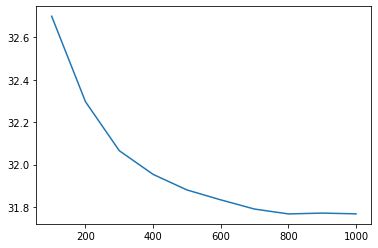

In [ ]:
plt.plot([100*x for x in range(1,11)], psnr_list)
plt.show()

In [ ]:
from math import log10, sqrt
var_hidden = np.random.randint(100, 1000)
psnr_list = []

figure, axes = plt.subplots(5,2, figsize = (12,32))
for ii in range(1,11):
  #Setting variance for restoration functions
  var=ii*100
  #Adding Awgn with an unknown variance
  image1b=AWGN(var_hidden)
  #Setting the Donoho Threshold
  thr=(var**0.5)*math.sqrt(2*math.log(w*h))
  #Using the soft thresholding method for restoration
  temp1 = soft_thresholding(image1b, thr)
  #Adding the plot in the figure
  axes[(ii-1)%5, (ii-1)//5].imshow(temp1.astype(np.uint8))
  axes[(ii-1)%5, (ii-1)//5].set_title(var)

  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  psnr_list.append(psnr)
figure.show()

Output hidden; open in https://colab.research.google.com to view.

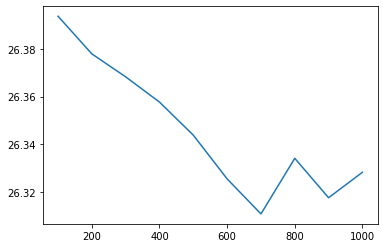

In [ ]:
plt.plot([100*x for x in range(1,11)], psnr_list)
plt.show()

In [ ]:
from math import log10, sqrt
var_hidden = np.random.randint(100, 1000)
psnr_list = []

figure, axes = plt.subplots(5,2, figsize = (12,32))
for ii in range(1,11):
  #Setting variance for restoration functions
  var=ii*100
  #Adding Awgn with an unknown variance
  image1b=AWGN(var_hidden)
  #Setting the Donoho Threshold
  thr=(var**0.5)*math.sqrt(2*math.log(w*h))
  #Using the hard thresholding method for restoration
  temp1 = chen_for_image(image1b, thr, 3)
  #Adding the plot in the figure
  axes[(ii-1)%5, (ii-1)//5].imshow(temp1.astype(np.uint8))
  axes[(ii-1)%5, (ii-1)//5].set_title(var)

  #Finding psnr
  psnr=psnrfunc(image1a,temp1[:w,:h,:])
  psnr_list.append(psnr)
figure.show()

Output hidden; open in https://colab.research.google.com to view.

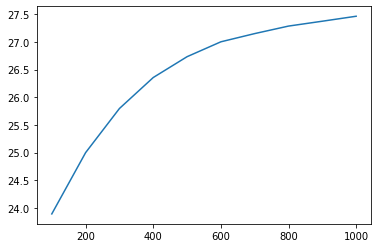

In [ ]:
plt.plot([100*x for x in range(1,11)], psnr_list)
plt.show()